# Midterm Exam (Sample Solutions)

## Question 1-1

----


In [1]:
## Loading packages
import re
import nltk
from nltk.corpus import PlaintextCorpusReader
import pandas as pd
import unicodedata
import re

## Notebook Settings
pd.options.display.max_colwidth = 200

In [2]:
## Loading corpus files into one CSV 

# jay_dir = 'midterm_inputdata/jay/'
# jay_corpus = PlaintextCorpusReader(jay_dir,'.*\.txt')

# jay = pd.DataFrame(
#     [(re.sub(r'\.txt$','',f), jay_corpus.raw(f)) for f in jay_corpus.fileids()],
#     columns=['title','lyric'])

In [3]:
## Loading CSV (from the original CSV)
jay = pd.read_csv('midterm_inputdata/jay.csv')
jay.head(10)

,title,lyric
0,我是如此相信,鳥群離開了森林 整座天空很灰心\n蝴蝶不再被吸引 玫瑰盛開的很安靜\n遠方的風雨不停 城市蒼白而孤寂\n徘徊無助的人群 焦慮著何時放晴\n故事裡能毀壞的只有風景\n誰也摧毀不了我們的夢境\n弦月旁的流星劃過了天際\n我許下的願望該向誰去說明\n隕石在浩瀚的宇宙間旅行\n璀璨的夜空裡漫天的水晶\n我的禱告終於有了回音\n我是如此相信 在背後支撐的是你\n一直與我並肩而行 仰望等太陽升起\n聽...
1,英雄,人生不是ㄧ個人的遊戲\nㄧ起奮鬥ㄧ起超越ㄧ起殺吧sup兄弟\n好戰好勝戰勝逆命\n管他天賦夠不夠我們都還需要再努力\n你的劍就是我的劍\n艾希的箭可不可以準ㄧ點 嘿\n你打野我來控兵線\n不要隨便慌張就交閃現\n旋轉跳躍你閉著眼\n卡特轉完會讓你閉上眼\n悟空蓋倫也轉圈圈\n盲僧李先生ㄧ腳把你 踢回老家\n擊殺 雙殺 三殺 Penta kill\n扛塔 偷拆 插眼讓我傳送\n...
2,雙截棍,岩燒店的煙味瀰漫 隔壁是國術館\n店裡面的媽媽桑 茶道 有三段\n教拳腳武術的老板 練鐵沙掌 耍楊家槍\n硬底子功夫最擅長 還會金鐘罩鐵布衫\n他們兒子我習慣 從小就耳濡目染\n什麼刀槍跟棍棒 我都耍的有模有樣\n什麼兵器最喜歡 雙截棍柔中帶剛\n想要去河南嵩山 學少林跟武當\n幹什麼(客) 幹什麼(客) 呼吸吐納心自在\n幹什麼(客) 幹什麼(客) 氣沉丹田手...
3,開不了口,才離開沒多久就開始 擔心今天的妳過得好不好\n整個畫面是妳 想妳想的睡不著\n嘴嘟嘟那可愛的模樣 還有在妳身上香香的味道\n我的快樂是妳 想妳想的都會笑\n沒有妳在我有多難熬(沒有妳在我有多難熬多煩惱)\n沒有妳煩我有多煩惱(沒有妳煩我有多煩惱多難熬)\n穿過雲層 我試著努力向妳奔跑\n愛才送到 妳卻已在別人懷抱\n就是開不了口 讓她知道\n我一定會呵護著妳 也逗妳笑\n妳...
4,床邊故事,從前從前有隻貓頭鷹 牠站在屋頂\n屋頂後面一遍森林 森林很安靜\n安靜的鋼琴在大廳 閣樓裡 仔細聽\n仔細聽 叮叮叮 什麼聲音\n乖乖睡 不要怕 聽我說\n乖乖睡 醒來就 吃蘋果\n不睡覺 的時候 有傳說\n會有人 咬你的 小指頭\n這故事 繼續翻頁 再翻頁\n你繼續 不想睡 我卻想睡\n然後我準備 去打開衣櫃\n去看看 躲著誰 去看看 躲著誰\...
5,夜曲 + 竊愛,一群嗜血的螞蟻 被腐肉所吸引 我面無表情 看孤獨的風景\n失去妳 愛恨開始分明 失去妳 還有什麼事好關心\n當鴿子不再象徵和平 我終於被提醒 廣場上餵食的是禿鷹\n我用漂亮的押韻 形容被掠奪一空的愛情\n啊 烏雲開始遮蔽 夜色不乾淨 公園裡 葬禮的回音 在漫天飛行\n送妳的 白色玫瑰 在純黑的環境凋零 烏鴉在樹枝上詭異的很安靜\n靜靜聽 我黑色的大衣 ...
6,以父之名,微涼的晨露 沾溼黑禮服 石板路有霧 父在低訴\n無奈的覺悟 只能更殘酷 一切都為了 通往聖堂的路\n吹不散的霧 隱沒了意圖 誰輕柔踱步 停住\n還來不及哭 穿過的子彈 就帶走 溫度\n我們每個人都有罪 犯著不同的罪 我能決定誰對 誰又該要沈睡\n爭論不能解決 在永無止境的夜\n關掉你的嘴 唯一的恩惠\n擋在前面的人都有罪 後悔也無路可退 以父之名判決\...
7,美人魚,維京航海 日記簿 停留在甲板等日出\n瓶中信 被丟入 關於美人魚的紀錄\n中世紀 的秘密 從此後被塞入了瓶蓋\n千年來 妳似乎 為等誰而存在\n或許淒美 在曖昧 海與夕陽之間金黃的一切\n海岸線 在起霧 似乎是離別適合的季節\n霧散後 只看見 長髮的妳出現在岸邊\n為了愛 忘了危險\n美人魚的眼淚\n是一個連傷心都透明的世界\n地平線的遠方一輪滿月\n童話般感...
8,我要夏天,別怕曬的黑 看起來很健康\n泳池旁的妹 笑起來很陽光\n對你Say個Hey 出水芙蓉加甩頭\n你是哪位\n管他天多黑 反正還有月光\n腳步繼續追 衝上沙灘的浪\n越High越不累 音樂不停我們也停不下來\n舉起手來 尖叫吶喊\n螢光棒 仙女棒 管你還有什麼棒都一起搖擺\n衝衝衝衝衝 衝向海邊 Go Go Go Go Go 準備瘋癲\n我要夏天 在我耳邊碎碎唸\n衝...
9,我的時代,長大之後 我的日子會怎麼過\n環遊世界每天出國 也可能變成億萬富翁\n聽大人說出社會不好過 要好好珍惜唸書的時候\n這麼多事情等著我去做 我還不懂害怕是什麼\n心跳的節奏 奮力去戰鬥\n忽然發現身體不屬於我\n過完40歲生日後 開始髮線後退的噩夢\n成天看女兒跟別人談戀愛 兒子嗆老爸跟不上時代\n幸好我還有機會再重來 因為最好的時代是現在\n全世界都跳起來(跳起來) 我們...


In [4]:
## Preprocessing Function
## remove extra linebreaks whitespaces and unicode category punctuations and symbols
def preprocess(doc):
    doc = re.sub(r'\n+','\n', doc)
    doc = ''.join([c if unicodedata.category(c)[0] not in ["P", "S", "N"] else ' ' for c in doc]) ## symbols
    #doc= re.sub(r'[0-9a-zA-Z]+'," ", doc) ## remove english letters and numbers
    doc = ''.join([c if unicodedata.category(c) not in ["Ll", "Lu"] else ' ' for c in doc]) ## alphabets
    doc = re.sub(r'[ \u3000]+', ' ', doc)
    doc = '\n'.join([line.strip() for line in doc.split('\n')])
    return doc

## Check preprocessed results
x= list(jay.lyric)[198]
print(x)
print("="*10)
print(preprocess(x))

昨天晚上做了個夢　我走進撒哈拉沙漠　空無一人站在太陽下
攝氏六十六點六度　快要焚化我的眼珠　忽然一場大雨降下來
汗水被那雨水沖走　結束四十天的折磨　荒漠一轉變成了綠洲
彩虹下有一棵大樹　大樹上有一顆蘋果　咬下一口我就全明白
可不可以讓我再　讓我再一次　回到那個美麗世界裡　找自己
嘩啦啦啦啦啦　天在下雨
嘩啦啦啦啦啦　雲在哭泣
嘩啦啦啦啦啦　滴入我的心　oh yeah~
不用說我只會胡思亂想　不用跟我說我只會妄想
嘩啦啦啦啦啦　讓我去淋雨
我只希望能夠再　能夠再一次　回到那個美麗時光裡　找自己
擠在公共汽車像個沙丁魚　上班下班每天是規律　這麼多的人到哪裡去
每個面孔寫著無奈　爸爸媽媽彼此沒有愛　難道這就是生命的真理
可不可以讓我再　讓我再一次　回到那個美麗世界裡　去逃避
昨天晚上做了個夢 我走進撒哈拉沙漠 空無一人站在太陽下
攝氏六十六點六度 快要焚化我的眼珠 忽然一場大雨降下來
汗水被那雨水沖走 結束四十天的折磨 荒漠一轉變成了綠洲
彩虹下有一棵大樹 大樹上有一顆蘋果 咬下一口我就全明白
可不可以讓我再 讓我再一次 回到那個美麗世界裡 找自己
嘩啦啦啦啦啦 天在下雨
嘩啦啦啦啦啦 雲在哭泣
嘩啦啦啦啦啦 滴入我的心
不用說我只會胡思亂想 不用跟我說我只會妄想
嘩啦啦啦啦啦 讓我去淋雨
我只希望能夠再 能夠再一次 回到那個美麗時光裡 找自己
擠在公共汽車像個沙丁魚 上班下班每天是規律 這麼多的人到哪裡去
每個面孔寫著無奈 爸爸媽媽彼此沒有愛 難道這就是生命的真理
可不可以讓我再 讓我再一次 回到那個美麗世界裡 去逃避


In [5]:
## Preprocess the corpus
jay['lyric_pre'] = [preprocess(l) for l in jay.lyric]

In [6]:
jay.iloc[[100,200],:]

,title,lyric,lyric_pre
100,斷了的弦,斷了的弦再怎麼練 我的感覺你已聽不見\n你的轉變像斷掉的弦 再怎麼接音都不對 你的改變我能夠分辨\n＊我沉默 你的話也不多 我們之間少了什麼 不說\n哎唷～微笑後表情終於有點難過(握著你的手) 問你決定了再走\n我突然釋懷的笑 笑聲盤旋半山腰\n隨風在飄搖啊搖 來到你的面前繞\n你淚水往下的掉 說會記住我的好 我也彎起了嘴角笑\n你的美已經給了誰 追了又追我要不回\n我瞭解離開樹的葉 屬於...,斷了的弦再怎麼練 我的感覺你已聽不見\n你的轉變像斷掉的弦 再怎麼接音都不對 你的改變我能夠分辨\n我沉默 你的話也不多 我們之間少了什麼 不說\n哎唷 微笑後表情終於有點難過 握著你的手 問你決定了再走\n我突然釋懷的笑 笑聲盤旋半山腰\n隨風在飄搖啊搖 來到你的面前繞\n你淚水往下的掉 說會記住我的好 我也彎起了嘴角笑\n你的美已經給了誰 追了又追我要不回\n我瞭解離開樹的葉 屬於地上...
200,你怎麼連話都說不清楚,這首歌沒有唱過．但是是我寫的．然後．寫給一個好朋友的歌\n那．我自己重新來唱．我覺得應該．版本真的也不錯\n想別的 可是在你眼中察覺什麼一閃而過\n怎是像是寂寞 於是我會更沉默\n沒說的 可是在你眼中察覺什麼一閃而過\n而我看她笑著走開 於是我裝做不懂 怎麼能拆穿你的不同\n偏偏 這地球 這麼擠 這麼小 這麼瘦 太陽刻意曬得那麼兇\n記得離別在拆散一點以後\n你怎麼連話都說不清楚 那溫柔的...,這首歌沒有唱過 但是是我寫的 然後 寫給一個好朋友的歌\n那 我自己重新來唱 我覺得應該 版本真的也不錯\n想別的 可是在你眼中察覺什麼一閃而過\n怎是像是寂寞 於是我會更沉默\n沒說的 可是在你眼中察覺什麼一閃而過\n而我看她笑著走開 於是我裝做不懂 怎麼能拆穿你的不同\n偏偏 這地球 這麼擠 這麼小 這麼瘦 太陽刻意曬得那麼兇\n記得離別在拆散一點以後\n你怎麼連話都說不清楚 那溫柔的...


## Question 1-2

-----


In [7]:
## packages
import pickle
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib
import matplotlib.pyplot as plt

## plotting settings
plt.style.use('ggplot')
matplotlib.rcParams['figure.dpi'] = 300
matplotlib.rcParams['font.sans-serif']=["PingFang HK"] ## set ur own chinese font

In [8]:
# ##############################################
# ## Uncommment this when word seg is needed####
# ##############################################

# import ckip_transformers
# from ckip_transformers.nlp import CkipWordSegmenter, CkipPosTagger
# #Initialize drivers
# ws_driver = CkipWordSegmenter(level=3, device=-1)
# pos_driver = CkipPosTagger(level=3, device=-1)

# def my_tokenizer(doc):
#     # `doc`: a list of corpus documents (each element is a document long string)
#     cur_ws = ws_driver(doc, use_delim = True, delim_set='\n')
#     cur_pos = pos_driver(cur_ws)
#     doc_seg = [[(x,y) for (x,y) in zip(w,p)]  for (w,p) in zip(cur_ws, cur_pos)]
#     return doc_seg

In [9]:
# %%time

# ##############################################
# ## Uncommment this when word seg is needed####
# ##############################################

## Perform word seg in Google Colab
## It takes about 40s in Google Colab

# jay_lyric_wordseg = my_tokenizer(list(jay.lyric_pre))

# import pickle
# with open('midterm-jay-lyric-wordseg.pickle', 'wb') as f:
#     pickle.dump(jay_lyric_wordseg, f, protocol=pickle.HIGHEST_PROTOCOL)


In [10]:
with open('midterm-jay-lyric-wordseg.pickle', 'rb') as f:
    jay_lyric_wordseg = pickle.load(f)

In [11]:
fileids = list(jay.title)

In [12]:
## select words whose POS starts with N or V but NOT pronouns (Nh) or numbers (Neu)
jay_words = [[(w,p) for (w,p) in text if re.match(r'^[NV](?!(h|eu))',p)] for text in jay_lyric_wordseg]
jay_norm = [' '.join([w for w,p in text]) for text in jay_words]

In [13]:
## use words len >=2
cv = CountVectorizer(token_pattern=r'[^\s]{2,}', min_df = 2)
jay_bow = cv.fit_transform(jay_norm)
jay_array = jay_bow.toarray()

# show document feature vectors
# arrange data frame according to column sums
jay_bow_df = pd.DataFrame(jay_array, columns=cv.get_feature_names(), index = fileids)
s = jay_bow_df.sum()
# jay_bow_df[s.sort_values(ascending=False).index[:50]]

In [14]:
print(jay_bow_df.shape)

(212, 2031)


In [15]:
jay_bow_df

,一下,一些,一切,一半,一幕幕,一樣,一次次,一生,一統,一行行,...,默劇,默契,默片,點亮,點心,點頭,鼓勵,鼓掌,鼻子,龍捲風
我是如此相信,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
英雄,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
雙截棍,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
開不了口,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
床邊故事,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
大頭貼,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
不知不覺愛上你,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
熊貓人,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
哇靠,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [16]:
tv = TfidfVectorizer(min_df=2,
                     max_df=1.0,
                     norm='l2',
                     use_idf=True,
                     smooth_idf=True,
                     token_pattern=r'[^\s]{2,}')
tv_matrix = tv.fit_transform(jay_norm)

In [17]:
print(tv_matrix.shape)

(212, 2031)


In [18]:
# arrange data frame according to column sums
jay_tv_df = pd.DataFrame(tv_matrix.toarray(), columns=tv.get_feature_names(), index = fileids)
s = jay_tv_df.sum()
jay_tv_df[s.sort_values(ascending=False).index[:50]].round(2)

,知道,離開,什麼,沒有,這樣,世界,愛情,回憶,媽媽,時間,...,陽光,思念,難過,輕輕,沉默,失去,回到,習慣,安靜,音樂
我是如此相信,0.00,0.07,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,...,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.08,0.0
英雄,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,...,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0
雙截棍,0.00,0.00,0.10,0.00,0.00,0.00,0.0,0.0,0.07,0.0,...,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.07,0.00,0.0
開不了口,0.22,0.08,0.00,0.28,0.00,0.00,0.0,0.0,0.00,0.0,...,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.10,0.0
床邊故事,0.00,0.00,0.03,0.00,0.00,0.03,0.0,0.0,0.00,0.0,...,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.08,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
大頭貼,0.04,0.00,0.04,0.08,0.24,0.00,0.0,0.0,0.00,0.0,...,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0
不知不覺愛上你,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,...,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0
熊貓人,0.00,0.00,0.00,0.00,0.00,0.09,0.0,0.0,0.00,0.0,...,0.12,0.0,0.0,0.13,0.00,0.00,0.0,0.00,0.00,0.0
哇靠,0.00,0.00,0.11,0.00,0.00,0.00,0.0,0.0,0.00,0.0,...,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0


In [19]:
jay_tv_df.round(2)

,一下,一些,一切,一半,一幕幕,一樣,一次次,一生,一統,一行行,...,默劇,默契,默片,點亮,點心,點頭,鼓勵,鼓掌,鼻子,龍捲風
我是如此相信,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
英雄,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.13,0.0,0.0,0.0,0.0,0.0,0.0,0.0
雙截棍,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
開不了口,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
床邊故事,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
大頭貼,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
不知不覺愛上你,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
熊貓人,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
哇靠,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [20]:
similarity_doc_matrix = cosine_similarity(tv_matrix)
similarity_doc_df = pd.DataFrame(similarity_doc_matrix, index=fileids, columns=fileids)

Z = linkage(similarity_doc_matrix, 'ward')

In [21]:
similarity_doc_df.round(2)

,我是如此相信,英雄,雙截棍,開不了口,床邊故事,夜曲 + 竊愛,以父之名,美人魚,我要夏天,我的時代,...,對不起,伊斯坦堡,反方向的鐘,情畫,兩個寂寞,大頭貼,不知不覺愛上你,熊貓人,哇靠,默
我是如此相信,1.00,0.00,0.00,0.01,0.10,0.09,0.08,0.01,0.02,0.02,...,0.00,0.03,0.02,0.07,0.00,0.01,0.00,0.01,0.03,0.06
英雄,0.00,1.00,0.00,0.02,0.07,0.00,0.01,0.00,0.00,0.00,...,0.04,0.00,0.01,0.00,0.00,0.03,0.00,0.01,0.03,0.00
雙截棍,0.00,0.00,1.00,0.00,0.01,0.01,0.00,0.01,0.02,0.01,...,0.00,0.03,0.00,0.01,0.02,0.01,0.03,0.12,0.01,0.00
開不了口,0.01,0.02,0.00,1.00,0.02,0.02,0.07,0.00,0.02,0.05,...,0.03,0.05,0.03,0.02,0.02,0.03,0.00,0.05,0.04,0.00
床邊故事,0.10,0.07,0.01,0.02,1.00,0.04,0.03,0.01,0.09,0.01,...,0.02,0.04,0.02,0.00,0.05,0.04,0.00,0.02,0.03,0.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
大頭貼,0.01,0.03,0.01,0.03,0.04,0.00,0.01,0.01,0.00,0.02,...,0.03,0.03,0.00,0.00,0.03,1.00,0.00,0.00,0.02,0.00
不知不覺愛上你,0.00,0.00,0.03,0.00,0.00,0.02,0.00,0.04,0.00,0.06,...,0.00,0.00,0.02,0.03,0.04,0.00,1.00,0.00,0.01,0.00
熊貓人,0.01,0.01,0.12,0.05,0.02,0.00,0.05,0.03,0.02,0.03,...,0.03,0.03,0.02,0.00,0.02,0.00,0.00,1.00,0.06,0.00
哇靠,0.03,0.03,0.01,0.04,0.03,0.01,0.06,0.09,0.02,0.02,...,0.02,0.03,0.05,0.01,0.02,0.02,0.01,0.06,1.00,0.02


In [22]:
## Plot Dendrogram
plt.figure(figsize=(15, 40))
plt.title("Jay Chou Analysis")
plt.xlabel("Song Titles")
plt.ylabel('Distance')
color_threshold = 2
dendrogram(Z, labels=fileids,
           orientation = 'right',
           leaf_rotation = 0, 
           leaf_font_size= 10,
           color_threshold = color_threshold, above_threshold_color='b')
plt.axvline(x=color_threshold, c='k', ls='--', lw=0.5)
plt.tight_layout()
#plt.savefig('midterm/question1-2-output-dendrogram.jpeg',dpi=300)

## Question 2-1

-----


In [23]:
import nltk
import numpy as np
import random
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd
pd.options.display.max_colwidth = 200

In [24]:
## Import train and test
with open('midterm_inputdata/chinese_name_gender_train.txt', 'r') as f:
    train = [l.replace('\n','').split(',') for l in f.readlines() if len(l.split(','))==2]

with open('midterm_inputdata/chinese_name_gender_test.txt', 'r') as f:
    test = [l.replace('\n','').split(',') for l in f.readlines() if len(l.split(','))==2]

## Sentiment Distrubtion for Train and Test
print(Counter([label for (words, label) in train]))
print(Counter([label for (words, label) in test]))

X_train = [name for (name, gender) in train]
X_test = [name for (name, gender) in test]
y_train = [gender for (name, gender) in train]
y_test = [gender for (name, gender) in test]

Counter({'男': 240078, '女': 239922})
Counter({'女': 60078, '男': 59922})


In [25]:
## self-defined tokenzier
def myTokenizer(text):
    ngrams=[]
    ngrams.append(text[1:])
    ngrams.append(text[1])
    ngrams.append(text[2])
    return ngrams

## text vectorization
cv = CountVectorizer(min_df = 100,
                     tokenizer=myTokenizer)

X_train_bow = cv.fit_transform(X_train)
X_test_bow=cv.transform(X_test)

print(X_train_bow.shape)
print(X_test_bow.shape)

(480000, 975)
(120000, 975)


In [26]:
# get all unique words in the corpus
vocab = cv.get_feature_names()

# show document feature vectors
X_train_bow_df = pd.DataFrame(X_train_bow.toarray(), columns=vocab, index = X_train)

In [27]:
X_train_bow_df.head()

,一,丁,三,世,丙,中,丹,丹丹,乃,久,...,麗萍,麗霞,麗麗,麟,黎,黎黎,鼎,齊,齡,龍
孫遠光,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
吳昌財,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
張俊達,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
馬豔蘭,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
宋燕敏,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [28]:
## Check bigram features (make sure no last name was included)
X_train_bow_df[[col for col in X_train_bow_df.columns if len(col)>1]].head()

,丹丹,云云,亞娟,亞楠,亞男,亞萍,亞麗,亭亭,亮亮,佩佩,...,麗珍,麗琴,麗紅,麗芳,麗英,麗華,麗萍,麗霞,麗麗,黎黎
孫遠光,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
吳昌財,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
張俊達,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
馬豔蘭,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
宋燕敏,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Question 2-2

------


In [29]:
import numpy as np
import sklearn
from sklearn.metrics import f1_score,confusion_matrix, plot_confusion_matrix
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

import lime
from lime.lime_text import LimeTextExplainer


import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('classic')

matplotlib.rcParams['font.sans-serif']=["PingFang HK"]
matplotlib.rcParams['figure.dpi']=300

In [30]:
%%time
model_gnb = GaussianNB()
model_gnb_acc = cross_val_score(estimator=model_gnb, X=X_train_bow.toarray(), y=y_train, cv=10, n_jobs=None)
model_gnb_acc

CPU times: user 1min 21s, sys: 57.5 s, total: 2min 19s
Wall time: 2min 32s


array([0.85516667, 0.85377083, 0.85664583, 0.85495833, 0.85522917,
       0.852     , 0.85447917, 0.85425   , 0.8533125 , 0.85383333])

In [31]:
%%time
model_lg = LogisticRegression(max_iter = 1000)
model_lg_acc = cross_val_score(estimator=model_lg, X=X_train_bow, y=y_train, cv=10, n_jobs=None)
model_lg_acc

CPU times: user 28.3 s, sys: 316 ms, total: 28.6 s
Wall time: 28.7 s


array([0.9795625 , 0.98004167, 0.98064583, 0.98120833, 0.979625  ,
       0.98035417, 0.98033333, 0.98039583, 0.98122917, 0.98110417])

In [32]:
print("Mean Accuracy of Naive Bayes Model: ", model_gnb_acc.mean())
print("Mean Accuracy of Logistic Regression Model:", model_lg_acc.mean())

Mean Accuracy of Naive Bayes Model:  0.8543645833333334
Mean Accuracy of Logistic Regression Model: 0.98045


In [33]:
%%time
## Grid Search
parameters = {'C': (1,5,10)}
clf = GridSearchCV(model_lg, parameters, cv=10, n_jobs=None) ## `-1` run in parallel
clf.fit(X_train_bow, y_train)

CPU times: user 2min 19s, sys: 3.47 s, total: 2min 22s
Wall time: 2min 22s


GridSearchCV(cv=10, error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=1000, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='lbfgs',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated', n_jobs=None, param_grid={'C': (1, 5, 10)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [34]:
clf.best_params_

{'C': 10}

Text(0.5, 1.0, 'Confusion Matrix (Normalized %)')

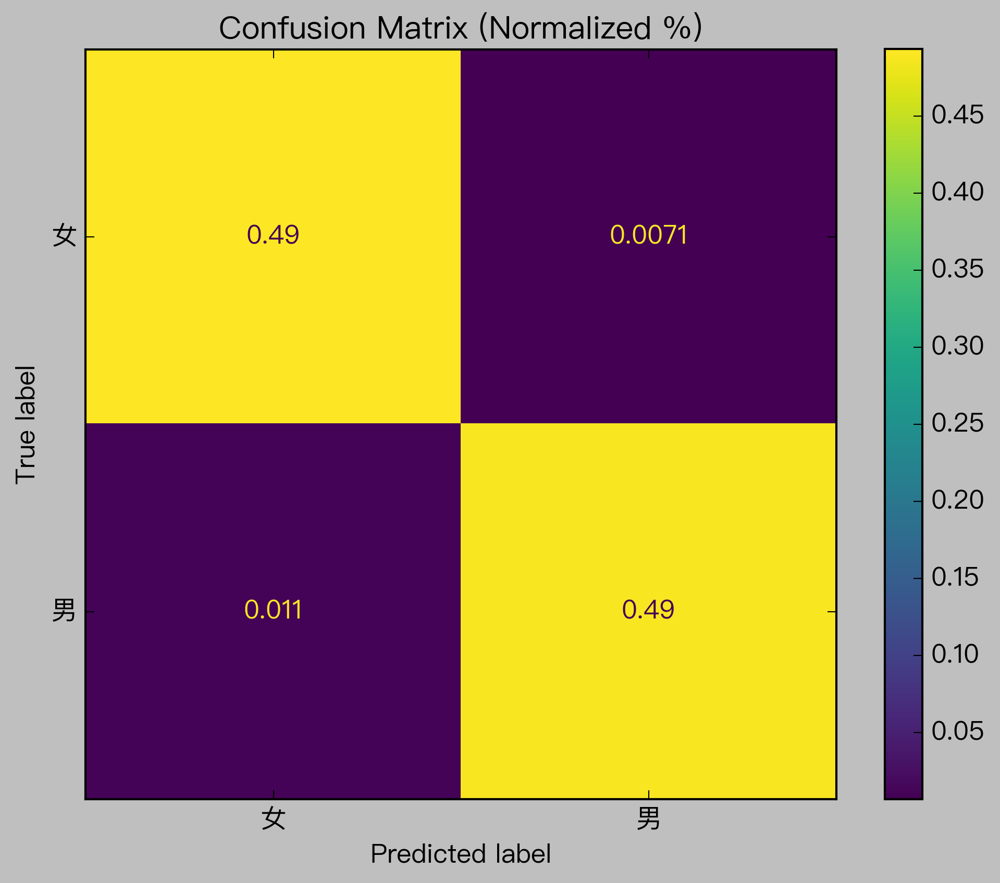

In [35]:
plot_confusion_matrix(clf, X_test_bow, y_test, normalize='all')
plt.title("Confusion Matrix (Normalized %)")

Text(0.5, 1.0, 'Confusion Matrix (Frequencies)')

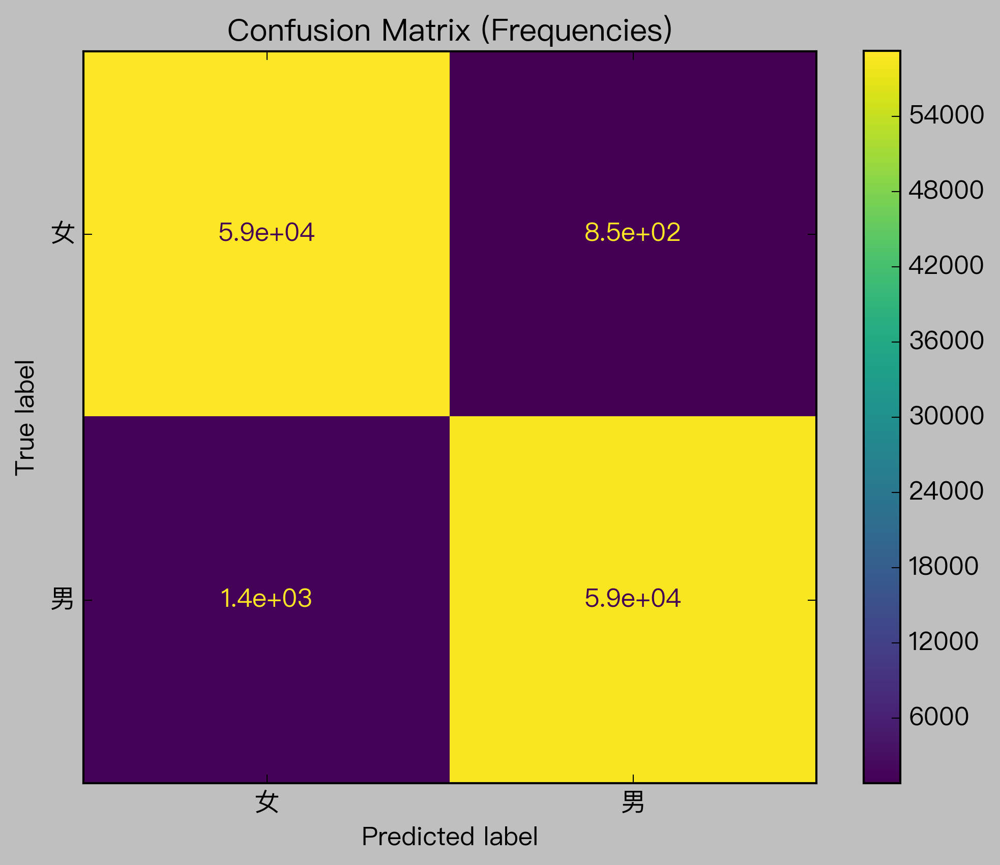

In [36]:
plot_confusion_matrix(clf, X_test_bow, y_test, normalize=None)
plt.title("Confusion Matrix (Frequencies)")

In [37]:
## Pipeline for LIME
pipeline = Pipeline([
  ('vectorizer',cv), 
  ('clf', LogisticRegression(C=10, max_iter = 1000))])
pipeline.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('vectorizer',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=1.0,
                                 max_features=None, min_df=100,
                                 ngram_range=(1, 1), preprocessor=None,
                                 stop_words=None, strip_accents=None,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=<function myTokenizer at 0x7fe9e4489510>,
                                 vocabulary=None)),
                ('clf',
                 LogisticRegression(C=10, class_weight=None, dual=False,
                                    fit_intercept=True, intercept_scaling=1,
                                    l1_ratio=None, max_iter=1000,
                  

In [38]:
explainer = LimeTextExplainer(class_names=['女','男'],char_level=True, bow=False)
test_name = ["王貴瑜",'林育恩','張純映','陳英雲']
explanations = []
for n in test_name:
    explanations.append(explainer.explain_instance(n, pipeline.predict_proba))

In [39]:
explanations[0].show_in_notebook(text=True)

In [40]:
explanations[1].show_in_notebook(text=True)

In [41]:
explanations[2].show_in_notebook(text=True)

In [42]:
explanations[3].show_in_notebook(text=True)

In [43]:
## Feature Importance Analysis
importances = pipeline.named_steps['clf'].coef_.flatten()

## Select top 10 positive/negative weights
top_indices_pos = np.argsort(importances)[::-1][:10]## top 10 for positve weights
top_indices_neg = np.argsort(importances)[::-1][-10:] ## bottom 10 for negative weights

## Get featnames from tfidfvectorizer
feature_names = np.array(cv.get_feature_names()) # List indexing is different from array
feature_importance_df = pd.DataFrame({'FEATURE': feature_names[np.concatenate((top_indices_pos, top_indices_neg))],
                                     'IMPORTANCE': importances[np.concatenate((top_indices_pos, top_indices_neg))],
                                     'SENTIMENT': ['pos' for _ in range(len(top_indices_pos))]+['neg' for _ in range(len(top_indices_neg))]})
feature_importance_df

,FEATURE,IMPORTANCE,SENTIMENT
0,剛,11.467391,pos
1,兵,11.026283,pos
2,強,10.852465,pos
3,豪,10.239195,pos
4,生,10.011794,pos
5,斌,9.963342,pos
6,臣,9.946213,pos
7,虎,9.905570,pos
8,濤,9.798250,pos
9,鋒,9.735969,pos


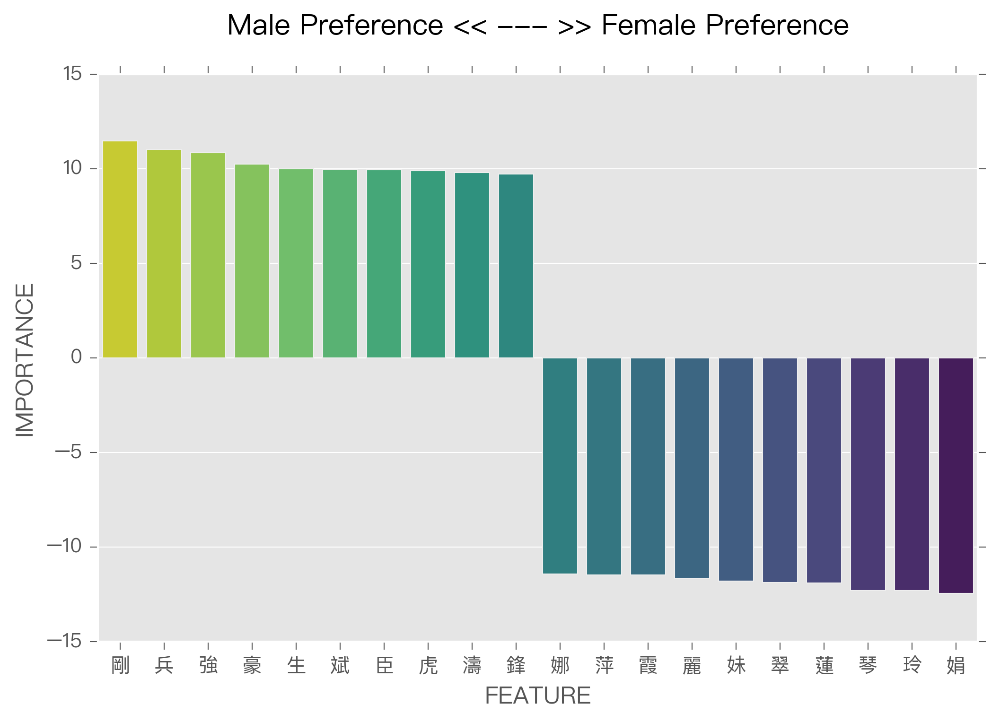

In [44]:
## Visualize feature importance

plt.style.use('ggplot')

matplotlib.rcParams['font.sans-serif']=["PingFang HK"]
matplotlib.rcParams['figure.dpi']=300
plt.figure(figsize=(8,5))
pal = sns.color_palette("viridis", len(feature_importance_df.index))
sns.barplot(x=feature_importance_df['FEATURE'], y=feature_importance_df['IMPORTANCE'], palette=np.array(pal[::-1]))
plt.title("Male Preference << --- >> Female Preference\n")
plt.savefig('midterm/_question2-2-output-featimportance.jpeg', bbox_inches='tight',dpi=300)

## Question 3-1


----


In [45]:
import pandas as pd
import unicodedata
import re
import nltk
import pickle
import numpy as np
import sklearn
from sklearn.metrics.pairwise import cosine_similarity
from scipy.cluster.hierarchy import dendrogram, linkage
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
sns.set(font_scale=0.7)
matplotlib.rcParams['figure.dpi'] = 300
matplotlib.rcParams['font.sans-serif']=["PingFang HK"]
pd.options.display.float_format = '{:,.2f}'.format


In [46]:
## remove extra linebreaks whitespaces and unicode category punctuations and symbols
def preprocess(doc):
    doc = re.sub(r'\n+','\n', doc)
    doc = ''.join([c if unicodedata.category(c)[0] not in ["P", "S","N"] else ' ' for c in doc]) ## symbols
    #doc= re.sub(r'[0-9a-zA-Z]+'," ", doc) ## remove english letters and numbers
    doc = ''.join([c if unicodedata.category(c) not in ["Ll", "Lu"] else ' ' for c in doc]) 
    doc = re.sub(r'[ \u3000]+', ' ', doc)
    doc = '\n'.join([line.strip() for line in doc.split('\n')])
    return doc

apple_df = pd.read_csv('midterm_inputdata/apple5000.csv')
apple_df['text_pre'] = [preprocess(text) for text in apple_df.text]

apple_df.head()

,doc_id,text,text_pre
0,1,【鄧玉瑩╱台中報導】台中市警二分局育才派出所爆發疑似集體索賄案，台中地檢署檢察官指揮調查局中部機動組查出，轄區警員柯文山利用職權之便，向轄區飯店、色情業者索賄，昨天深夜向地院聲請羈押獲准。派出所隨即表示，將對柯某撤職查辦、從嚴處分。\n\n\n台中地檢署檢察官吳祚延指揮調查局中機組幹員，搜索台中市警二分局育才派出所，帶回警員柯文山，進行偵訊。檢調同時到台中市「合利太」飯店大樓展開搜索，除帶...,鄧玉瑩 台中報導 台中市警二分局育才派出所爆發疑似集體索賄案 台中地檢署檢察官指揮調查局中部機動組查出 轄區警員柯文山利用職權之便 向轄區飯店 色情業者索賄 昨天深夜向地院聲請羈押獲准 派出所隨即表示 將對柯某撤職查辦 從嚴處分\n台中地檢署檢察官吳祚延指揮調查局中機組幹員 搜索台中市警二分局育才派出所 帶回警員柯文山 進行偵訊 檢調同時到台中市 合利太 飯店大樓展開搜索 除帶回帳冊 飯店...
1,2,陸軍542旅下士洪仲丘關禁閉被操死，該旅副旅長何江忠昨遭軍高檢向最高軍事法院聲押獲准。何江忠的前同事說：「他（何江忠）只能用『陰險』兩字形容，得罪他都沒好下場。」還說他常用官威逼部下，「仗勢欺人、人神共憤，大家都不喜歡他。」被他帶過的阿兵哥說，懲處到了何手上都會加重，簡直是「大魔頭」。\n曾與何江忠共事1年的軍官昨向《蘋果》爆料，前年何江忠還在馬祖東引擔任副指揮官時，遇到年度本職學能鑑測，...,陸軍 旅下士洪仲丘關禁閉被操死 該旅副旅長何江忠昨遭軍高檢向最高軍事法院聲押獲准 何江忠的前同事說 他 何江忠 只能用 陰險 兩字形容 得罪他都沒好下場 還說他常用官威逼部下 仗勢欺人 人神共憤 大家都不喜歡他 被他帶過的阿兵哥說 懲處到了何手上都會加重 簡直是 大魔頭\n曾與何江忠共事 年的軍官昨向 蘋果 爆料 前年何江忠還在馬祖東引擔任副指揮官時 遇到年度本職學能鑑測 他卻要步兵學校裁...
2,3,終於拿到冠軍，感覺真是棒，尤其是從蔣宸豑的手上搶過來，算是報了一箭之仇。其實我今天的推桿感覺真的很不好，有好幾次3呎內的短推都錯過，不然也不會打得這麼累。」今年第3次參賽，前兩次分別在第1輪及8強賽輸給蔣宸豑。\n\n\n年齡：17歲身高：181公分體重：80公斤就讀學校：啟英高中二年級球齡：6年\n\n\n \n,終於拿到冠軍 感覺真是棒 尤其是從蔣宸豑的手上搶過來 算是報了一箭之仇 其實我今天的推桿感覺真的很不好 有好幾次 呎內的短推都錯過 不然也不會打得這麼累 今年第 次參賽 前兩次分別在第 輪及 強賽輸給蔣宸豑\n年齡 歲身高 公分體重 公斤就讀學校 啟英高中二年級球齡 年\n\n
3,4,【陳毓婷╱台北報導】過去業績不甚理想的中國人壽（2823），今年初找來南山人壽的專業經理人王銘陽擔任總經理後，不但保費收入大幅成長，而且獲利也出現轉機，今年上年已經轉虧為盈，小賺667萬元，擺脫今年第一季虧損近1.6億元的陰霾。\n\n\n中壽今年上半年的保費收入達155.7億元，較去年同期的96.6億元成長62%，與國內壽險業今年上半年保費收入比較，中壽首度擠進前五名。通常壽險公司在衝刺...,陳毓婷 台北報導 過去業績不甚理想的中國人壽 今年初找來南山人壽的專業經理人王銘陽擔任總經理後 不但保費收入大幅成長 而且獲利也出現轉機 今年上年已經轉虧為盈 小賺 萬元 擺脫今年第一季虧損近 億元的陰霾\n中壽今年上半年的保費收入達 億元 較去年同期的 億元成長 與國內壽險業今年上半年保費收入比較 中壽首度擠進前五名 通常壽險公司在衝刺新契約保單的情況下 成本支出會墊高 中壽今年第 季就...
4,5,台灣國際語文教育協會假借中央機關指導名義，招攬學員參加該機構舉辦的觀光研習營，活動宣稱「參加滿三梯次可退費」，實際上卻任意改期、提高收費。學員幾經爭執、《蘋果》追查發現真相後，業者同意學員的退費要求。攝影．報導╱褚明達\n台中市徐先生說，去年10月下旬，他看到台灣國際語文教育協會（以下簡稱台協）招攬「台灣觀光親善大使甄選研習營」學員的網路廣告，因內容豐富，他立即報名參加。台協在廣告上註明將...,台灣國際語文教育協會假借中央機關指導名義 招攬學員參加該機構舉辦的觀光研習營 活動宣稱 參加滿三梯次可退費 實際上卻任意改期 提高收費 學員幾經爭執 蘋果 追查發現真相後 業者同意學員的退費要求 攝影 報導 褚明達\n台中市徐先生說 去年 月下旬 他看到台灣國際語文教育協會 以下簡稱台協 招攬 台灣觀光親善大使甄選研習營 學員的網路廣告 因內容豐富 他立即報名參加 台協在廣告上註明將請 外...


In [47]:
# %%time

## Spacy Parsing

# import spacy
# nlp = spacy.load("zh_core_web_lg")

# mod_head=[]

# for doc in nlp.pipe(apple_df.text_pre, n_process=-1):
#     for t in doc:
#         if (t.dep_ == "amod"):
#             mod_head.append((t.text, t.head.text))
# len(mod_head)

# import pickle
# with open('midterm-apple-mod-head-lg.pickle', 'wb') as f:
#     pickle.dump(mod_head, f, protocol=pickle.HIGHEST_PROTOCOL)

In [48]:
with open('midterm-apple-mod-head-lg.pickle', 'rb') as f:
    mod_head=pickle.load(f)

In [49]:
## filter two-syllable NOUNS only
mod_head_fd = nltk.FreqDist([(m,n) for (m, n) in mod_head if len(n)>=2])
mod_head_fd2 = nltk.FreqDist([m+'_'+n for (m, n) in mod_head if len(n)>=2])
mod_head_df = pd.DataFrame(list(mod_head_fd2.items()), columns = ["MOD-NOUN","Frequency"]) 

In [50]:
mod_head_df.sort_values(['Frequency'],ascending=[False]).head(20)

,MOD-NOUN,Frequency
268,新_台幣,109
916,女_主角,82
18,總_經理,60
350,大_聯盟,48
162,新_北報,44
2302,液晶_電視,41
1301,男_主角,40
828,大_股東,39
198,好_朋友,39
280,新_產品,39


## Question 3-2

-------

In [51]:
## Get nouns and mods dict indices
nouns = {noun:i for i, noun in enumerate(set([head for (mod, head) in mod_head]))}
mods = {mod:i for i, mod in enumerate(set([mod for (mod, head) in mod_head]))}

## Create Noun by Modifiers Matrix
noun_by_mod = np.zeros(shape = (len(nouns), len(mods)), dtype='float32')
for ((m,n),c) in mod_head_fd.items():
    noun_by_mod[nouns[n],mods[m]] = noun_by_mod[nouns[n],mods[m]]+c

In [52]:
print(noun_by_mod.shape)

(16531, 11302)


In [53]:
col_sum_ind = np.argsort(-noun_by_mod.sum(axis=0))
row_sum_ind = np.argsort(-noun_by_mod.sum(axis=1))

col_cut = 10
row_cut = 70
col_ind = [i for i,s in enumerate(noun_by_mod.sum(axis=0)) if s > col_cut]
row_ind = [i for i,s in enumerate(noun_by_mod.sum(axis=1)) if s > row_cut]
print(len(row_ind))
print(len(col_ind))

43
631


In [54]:
noun_by_mod_filtered_df = pd.DataFrame(noun_by_mod, columns = mods, index=nouns).iloc[row_ind, col_ind]
print(noun_by_mod_filtered_df.shape)

similarity_noun = cosine_similarity(noun_by_mod_filtered_df)
similarity_noun_df = pd.DataFrame(similarity_noun, index=noun_by_mod_filtered_df.index, columns=noun_by_mod_filtered_df.index)

(43, 631)


Text(0.5, 1.0, 'Pairwise Cosine Similarity')

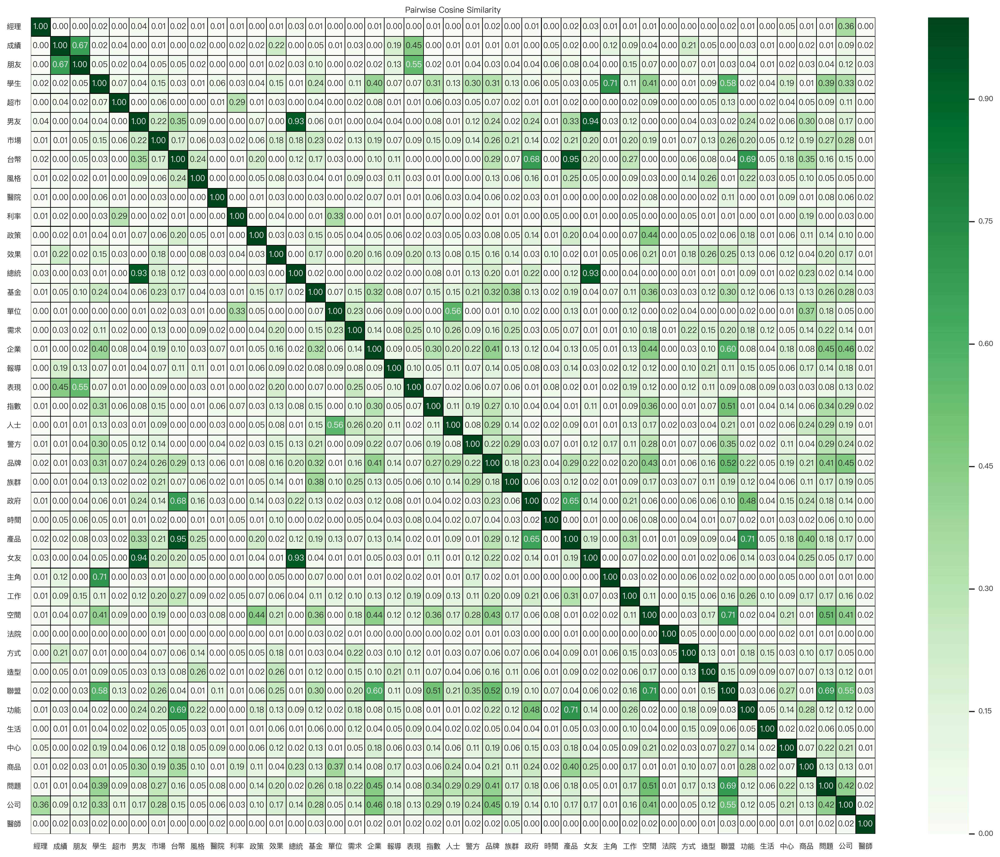

In [55]:
plt.figure(figsize=(20,15))
cf_hm1 = sns.heatmap(similarity_noun_df, annot=True, fmt='.2f', xticklabels=similarity_noun_df.index, yticklabels=similarity_noun_df.index, linewidths=.5, linecolor='black', cmap="Greens")
plt.yticks(rotation=0)
plt.title('Pairwise Cosine Similarity')

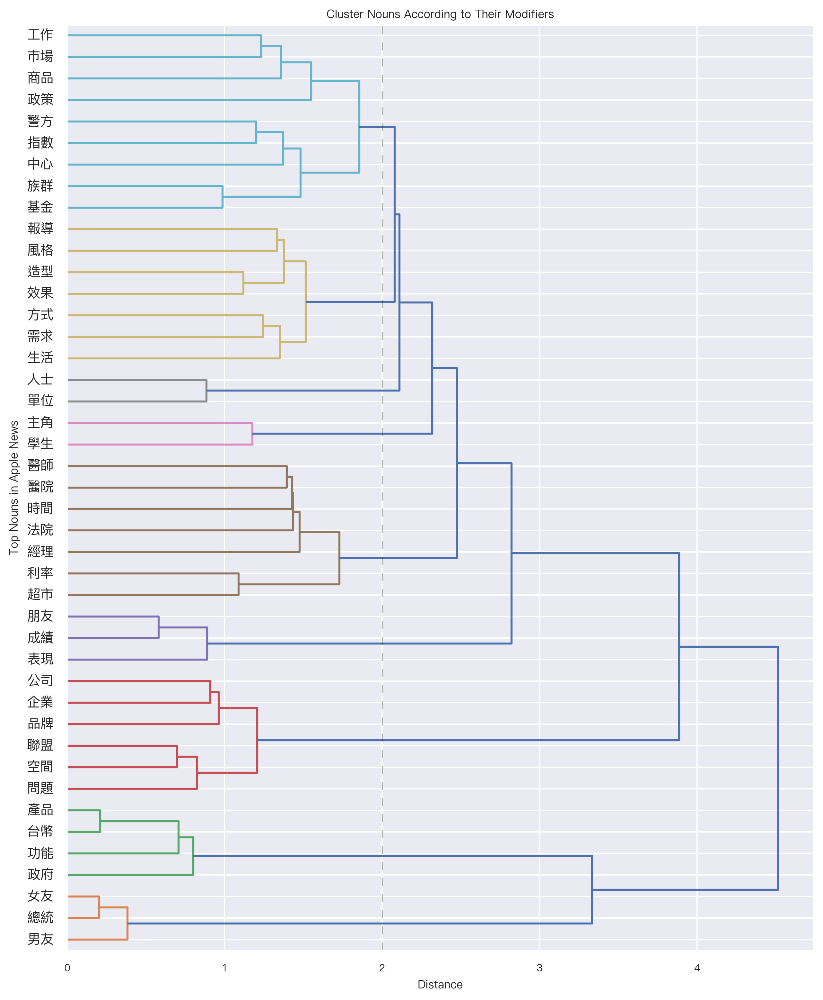

In [56]:
Z = linkage(similarity_noun, 'ward')
color_threshold=0.6
plt.figure(figsize=(10, 12))
plt.title("Cluster Nouns According to Their Modifiers")
plt.xlabel("Distance")
plt.ylabel('Top Nouns in Apple News')
color_threshold = 2
dendrogram(Z, labels=list(noun_by_mod_filtered_df.index),
           orientation = 'right',
           leaf_rotation = 0, 
           leaf_font_size= 10,
           color_threshold = color_threshold, above_threshold_color='b')
plt.axvline(x=color_threshold, c='k', ls='--', lw=0.5)